# Author

**Student Name**: Van Quoc Bao Ngo 
**Student ID**:  220747521



# A. Basic Component
Using the MLEnd London Sounds dataset, build a machine learning pipeline that takes as an input an audio segment and predicts whether the audio segment has been recorded indoors or outdoors.

## 1. Problem formulation
The problem of the basic solution is to try to predict **whether the audio file was record *indoor or outdoor***. So, this is a **classification problem**, whose target class (the one which we try to predict) is a *binary* variable - *indoor/outdoor*. </br>
To formulate the problem of basic component in a summary view with below steps:</br>
   - *Problem Input*: Audio data, acting as predictors (including the audio file and other related information such as areas or
   - *Model*: A machine learning (ML) model which would be used to predict the output from the given input </br>
   - *Problem Output*: Binary class - indoor or outdoor </br>

## 2. Machine Learning pipeline
To formulate the problem of basic component in a summary view with below steps:</br>
   - **Import input data** </br>
        + Audio file: there are total 2500 audio files (.mav), contained in 5 zip files. </br>
        + CSV file: contain data related to recording location (areas/spots/indoor or outdoor), file id and people recording the audios </br>
   - **Transformation**
       - *Feature extraction* </br>
            + power </br>
            + pitch: mean and standard deviation values </br>
            + voice frequency </br>
       - *Standardization*: Standardize the data of predictors by their mean and standard deviation </br>
   - **Split data into training and test sets**: Set test size = 20% and random seed = 123 </br>
   - **Model selection** 
        + Initialize all possible models for classification problems </br> 
        + Using **accuracy** as quality notion, test each specified model on validation set </br>
   - **Model hyperparameter tuning**: Use GridSearch cross validation to test all possible sets of hyperparameter to find the local optimal set for the chosen model </br>
   - **Predict the class of the data object**: Produce output (predicted class) on test set; the result would be a binary class - either '**indoor**' or '**outdoor**' </br>
   - **Evaluate output**: Looking at the classification report to examine other assessing metrics of the problem </br>
   
## 3. Transformation stage
According to the above-mentioned Machine Learning pipeline, the transformation stage contains 2 steps:
 - **Feature extraction**: if we simply use the audio file itself, the model cannot understand the data we try to feed it (raw .mav file), since most of the model would accept the input in some certain types, namely numeric data, categorical data or boolean data. Therefore, we need to convert the audio files into some understandable predictors that the prediction model can process
     - Input: Audio file (.mav)
     - Output: numeric metrics, including power, pitch and voice frequency  
 - **Standardization**: The numeric features extracted from audio files can be within different scales; hence, to avoid the case that one feature of large scale could overwhelm others, we will standardize the data
     - Standardize the data of predictors by their average (mean) and standard deviation (std)
         $ Standardized_X = \frac{X - mean}{std}\\ $

## 4. Modelling
As stated, the problem in basic components is a classification one, therefore, we need to use specific models which are able to solve such a problem. There are different models which are usually used in classification problems:
   - *Ensemble/bagging model*: RandomForest
   - *Nearest neighbor model*: K-neighbor
   - *Logistic regression model*
   - *Neural network model*
   - *Tree model*: DecisionTree
   
To decide which one suits best, we will use a heuristic approach by testing each model on the specified validation set to see which model generate the best quality metric, which would be 'accuracy' in this case.

## 5. Methodology
Before going to the training and validation stage, we need to ensure these steps being done:
 - Finish importing audio data
 - Finish transformation
 - Split the dataset into training set and test set

Then, what we need to do is to decide which model and which hyperparameter set work best on the fed train and validation data. **The methodology used here is to try all possible models or hyperparameter sets we could think of**.

For model selection, the **K-fold cross-validation** method would be used with each initialized models. The training set will be divided into train and validation set: each model will be trained with train set and validated by the validation set
    - For each model, the validation be run *k times* (aka k-fold)
    - To compare one model to another, we will use average '**accuracy**' score as notion of quality to benchmark (each time of validation will generate one accuracy score; after k times, we will calculate the average score)
    
After finish selecting the suitable model, to determine the optimal set of model hyperparameters, the similar approach would be applied. To save time, we could use the **GridSearchCV** method, which allows us to run through all possible hyperparameters we suspect and find out the best set with the highest average accuracy. GridSeachCV will also divide training set into train and validation set, then the train data will be fed to the chosen model and the validation set will be used to validate the model performance. For each set of hyperparameters, the validation will also go through k-times and we will also use average 'accuracy' score as our benchmark

## 6. Dataset
The dataset includes 2 sources:
   - Audio files: 
        - There are 2500 .mav files recorded by students in different areas/spots around London, UK
        - Each audio is around 7 second length on average
        - All the audio files is split into 5 zip files, which could be uploaded to google drive, and then mounted by google colab
   - CSV file:
       - The file contains 2500 data rows
       - It has 5 columns: file_id, area, spot, in_out, participant
       
The target classes (column in_out in the CSV file) looks quite **balance** between 'indoor' and 'outdoor' </br>
==> The probability we can pick either an indoor or outdoor audio is 50/50, which means we can use 50% as a benchmark and our model should be much higher than such a benchmark to be deemed a good enough one.

## 7. Code snippet

First, we need to import essential libraries as well as packages

In [824]:
# Import necessary libraries/packages

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.svm import SVC, LinearSVC

The audio files have been successfully unziped and stored in a folder in drive link [/content/drive/MyDrive/Data/MLEndLS/raw/*.wav]. </br>
We will access the link and load into a variable 'files'.

In [2]:
# Loading 2500 audio files
sample_path = 'C:/Users/ASUS/Desktop/Lab/Principles of ML/mini project/public data/raw/*.wav'
files = glob.glob(sample_path)
len(files)

2500

In [3]:
# View some examples of the Audio files that have been loaded
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

Use pandas library to read the provided CSV file

In [4]:
# Import/Read the CSV file
MLENDLS_df = pd.read_csv('./MLEndLS.csv').set_index('file_id') 
MLENDLS_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


Check the ratio of indoor recordings and outdoor ones: the number between indoor and outdoor audios seems to be **quite balance**, a bit more inclined to outdoor recordings

outdoor    1319
indoor     1181
Name: in_out, dtype: int64

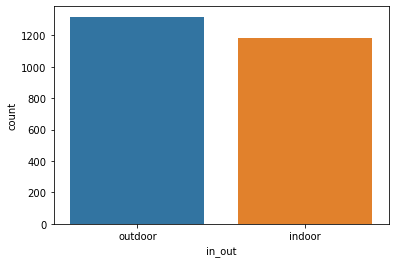

In [46]:
sns.countplot(data=MLENDLS_df, x='in_out')
MLENDLS_df['in_out'].value_counts()

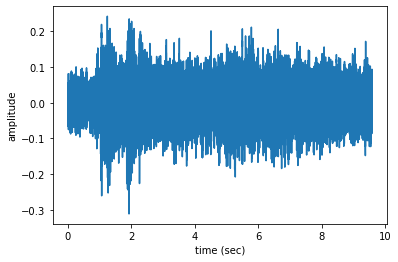

In [5]:
# Try to extract the amplitude and sampling rate of one example of Audio file
n=0
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

**Extracting features and corresponding labels**

In [6]:
# Create a function to extract pitch from Audio file
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

In [7]:
# Create function for feature extraction and targeted label
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('\\')[-1] # Extract fileid for audio file
    file_name = file.split('\\')[-1]
    yi = labels_file.loc[fileID]['in_out']=='indoor' # Extract binary labels corresponding to fileid: True=indoor, False=outdoor

    fs = None
    x, fs = librosa.load(file,sr=fs) # Extract amplitude and sampling rate for each audio
    if np.sum(x) == 0: # if the audio file has no data (flawed file), then ignore
        pass
    else:
        if scale_audio: x = x/np.max(np.abs(x)) # If scale_audio argument = True, then scale the extracted amplitude
        f0, voiced_flag = getPitch(x,fs,winLen=0.02) # Implement getpitch function
        
        # Extract features
        power = np.sum(x**2)/len(x)
        pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
        pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
        voiced_fr = np.mean(voiced_flag)

        xi = [power,pitch_mean,pitch_std,voiced_fr]
        X.append(xi)
        y.append(yi)

  return np.array(X),np.array(y)

Extract feature and label from a **randomly** sampled audio set

Create 3 different sets of ascending number of samples: 500 - 1000 - 2000 ==> going from the small number of samples first, then increasing

In [333]:
# From 500 sampled audio set
X_basic1, y_basic1 = getXy(np.array([files[i] for i in np.random.choice(range(2500),500,replace=False)]), labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)
# From 1000 sampled audio set
X_basic2, y_basic2 = getXy(np.array([files[i] for i in np.random.choice(range(2500),1000,replace=False)]), labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)
# From 2000 sampled audio set
X_basic3, y_basic3 = getXy(np.array([files[i] for i in np.random.choice(range(2500),2000,replace=False)]), labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

100%|██████████████████████████████████████████████████████████████████████████████| 2000/2000 [49:15<00:00,  1.48s/it]


Initially, we will go with 500 random samples

In [334]:
# Print out the shape of X and y
print('The shape of X is', X_basic1.shape) 
print('The shape of y is', y_basic1.shape)

# View label y
print('The labels vector is', y_basic1)

The shape of X is (500, 4)
The shape of y is (500,)
The labels vector is [ True False False  True  True False False False False False False False
  True False False False False False  True  True False False False  True
  True False  True  True False  True  True  True  True  True False  True
 False False  True  True  True False  True False  True False  True  True
  True  True False  True False False  True False  True False False  True
  True False False  True  True  True  True  True False  True False False
  True  True  True False False False False False False  True False False
  True False  True  True False False False  True  True  True False  True
  True  True False  True False  True  True  True  True  True False False
 False False  True  True False  True  True  True  True  True False False
  True False  True False False False False False  True False  True False
  True  True False  True  True False  True  True  True  True  True False
  True  True  True False False False  True False  T

 The number of indoor recordings is  248
 The number of outdoor recordings is  252


False    252
True     248
Name: class, dtype: int64

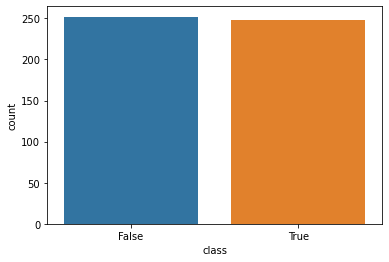

In [406]:
# Check the balance of binary classes: the sample seems to well represent the original target class, regarding its balance
print(' The number of indoor recordings is ', np.count_nonzero(y_basic1))
print(' The number of outdoor recordings is ', y_basic1.size - np.count_nonzero(y_basic1))

df = pd.DataFrame(X_basic1, columns=['power', 'pitch_mean', 'pitch_std', 'voiced_fr'], dtype='float')
df['class'] = y_basic1
sns.countplot(data=df, x='class')
df['class'].value_counts()

Check the relationship among predictors

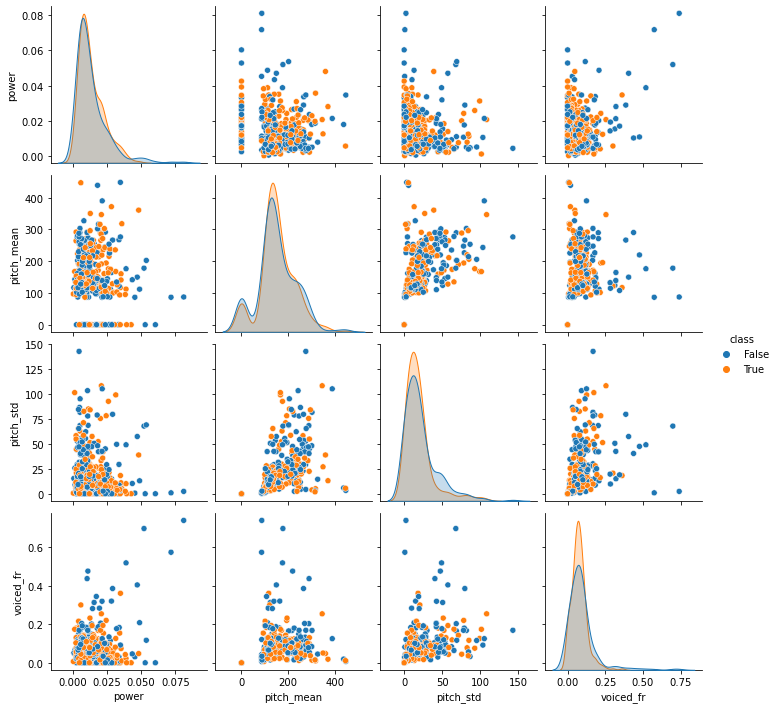

In [412]:
sns.pairplot(df, hue='class')

The insights we can see from the matrix of plots above:
 - The classes are quite balance
 - The correlation among extracted features seems to be weak; hence, we may not have to get rid of any

**Standardizing data by its mean and standard deviation**

<AxesSubplot:>

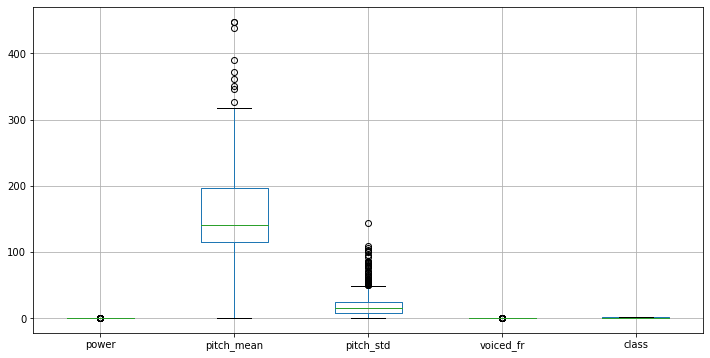

In [889]:
df.boxplot()

Based on the boxplot of 4 predictors, we can see each possesses values of different scales, where values of large scale could make the model overlook the values of smaller one.

In [368]:
# Standardization step
mean = X_basic1.mean(0)
sd =  X_basic1.std(0)

new_X = (X_basic1-mean)/sd
new_y = y_basic1

Split the whole transformed dataset into training and test set

In [369]:
# Split dataset into training and test set using train_test_split method
X_train, X_test, y_train, y_test = train_test_split(new_X, new_y, test_size=0.2, random_state=123)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((400, 4), (100, 4), (400,), (100,))

In [364]:
# spot check algorithms
models = []

models.append(('LR', LogisticRegression())) #Linear model
models.append(('KNN', KNeighborsClassifier())) # Nearest neighbor model
models.append(('CART', DecisionTreeClassifier())) # Tree model
models.append(('NN', MLPClassifier())) # Neural network model
models.append(('RF', RandomForestClassifier())) # Ensemble bagging model: RandomForest
models.append(('SVC', SVC())) # SVM method: SVC
models.append(('LinearSVC', LinearSVC())) # SVM method: LinearSVC

In [370]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action = "ignore", category=ConvergenceWarning) # avoid convergewarning if any

# Test all specified models on validation set with 'accuracy' as quality metric, by using K-fold cross validation
num_folds = 10 # number of validation times
seeds = 7 # random state
score = 'accuracy' # set notion of quality for cross-validation process, and use this as benchmarking
results = []
names = []

# Looping cross-val through all the initialized models
for name, model in models:
    k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
    cv = cross_val_score(model, X_train, y_train, cv=k_fold, scoring=score, error_score='raise')
    results.append(cv)
    names.append(name)
    a = (name, cv.mean(), cv.std())
    print(a)

('LR', 0.52, 0.0788986691902975)
('KNN', 0.5775, 0.05749999999999999)
('CART', 0.525, 0.04183300132670377)
('NN', 0.5774999999999999, 0.04670385423067351)
('RF', 0.5725, 0.08474225628339148)
('SVC', 0.58, 0.06403124237432849)
('LinearSVC', 0.52, 0.0714142842854285)


Text(0.5, 1.0, 'Model Accuracy')

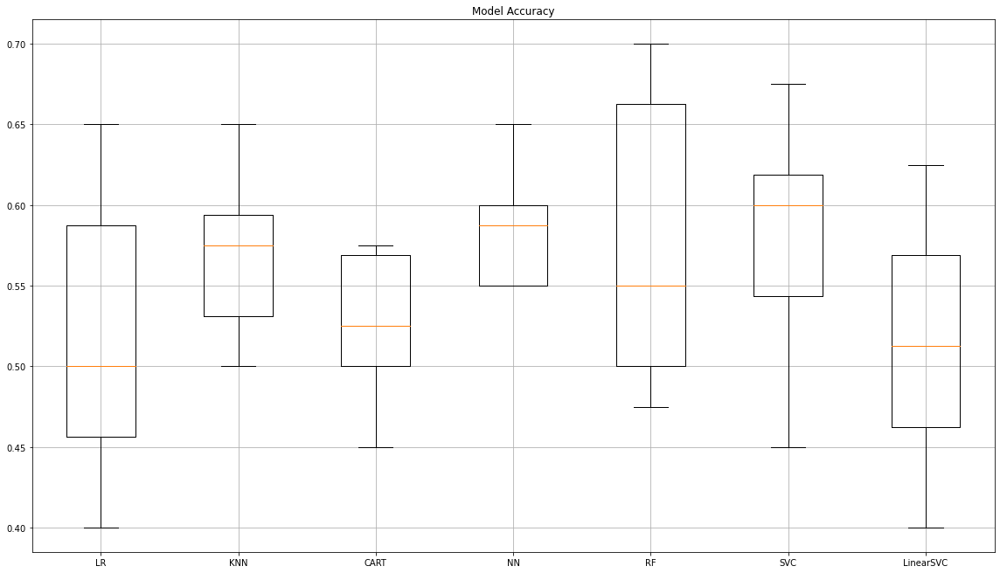

In [371]:
# Visualize the model average accuracy after above validation
plt.figure(figsize=(16,9))

plt.boxplot(results, showfliers= False)

plt.xticks(np.arange(1,8,1), labels=names)
plt.grid()
plt.tight_layout()
plt.title('Model Accuracy')

From the result above, **SVC** model seems to be the best option. Therefore, for the next step, we will tune the hyperparameters of the model

In [378]:
# Use GridSearchCV to tune model hyperparameters

# Set all possible values for each model parameters
params = {'C': [0.001, 0.01, 0.1, 1, 3, 5],
          'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
          'gamma': ['scale', 'auto', 1, 3, 5]}

classifier =  SVC() # Initialize the classifier
clf_cv = GridSearchCV(classifier, params, cv = 10, scoring='accuracy', return_train_score=True) # Test all sets of hyperparameters with GridSearchCV, with 10-fold val
clf_cv.fit(X_train, y_train) # Fit the classifier with the best hyperparameter set on training data
result = pd.DataFrame(clf_cv.cv_results_)

print('Best hyperparameter setting: {0}.'.format(clf_cv.best_estimator_))
print('Average accuracy on validation set across folds of best hyperparameter setting: {0}.'.format(clf_cv.best_score_))
print('Average accuracy on train set across folds of best hyperparameter setting: ', float(result[result['mean_test_score'] == float(clf_cv.best_score_)]['mean_train_score'].values))

Best hyperparameter setting: SVC(C=3, gamma=1).
Average accuracy on validation set across folds of best hyperparameter setting: 0.6150000000000001.
Average accuracy on train set across folds of best hyperparameter setting:  0.7505555555555556


The result on train and validation set tends to show the overfitting issue, though we have already tried to tune the hyperparameter with regularizing hyperparameter included.

To reduce overfitting, try to increase the number of training sample

Use 1000 random samples

 The number of indoor recordings is  486
 The number of outdoor recordings is  513
('LR', 0.4943670886075949, 0.054518584698721534)
('KNN', 0.5156962025316456, 0.04626658036748359)
('CART', 0.5244778481012657, 0.0467673475419164)
('NN', 0.5232120253164557, 0.05325903534404205)
('RF', 0.5118987341772152, 0.04796584242705658)
('SVC', 0.5332120253164556, 0.03653470048390717)
('LinearSVC', 0.4981170886075949, 0.05405862940359025)


Text(0.5, 1.0, 'Model Accuracy')

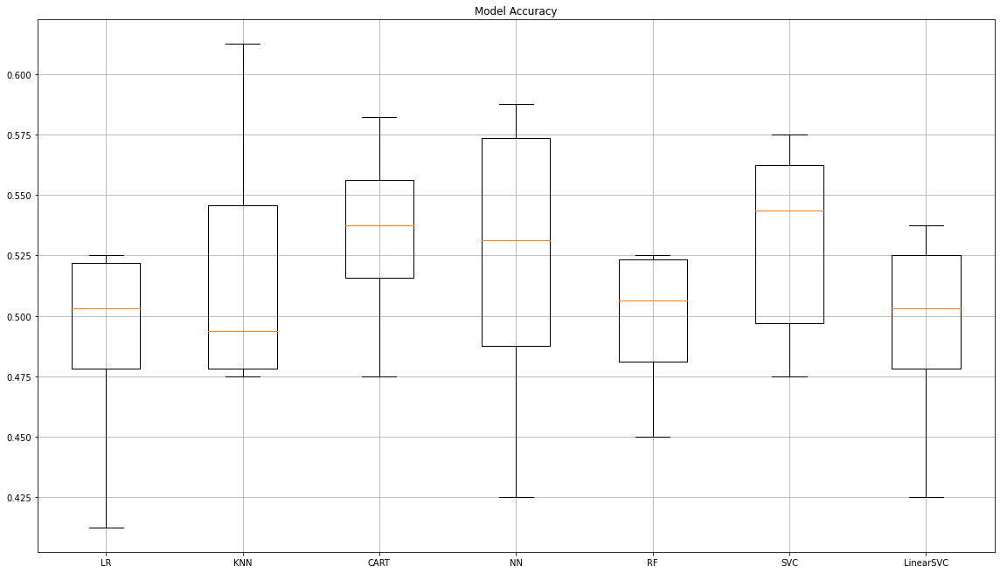

In [379]:
# Check the balance of binary classes
print(' The number of indoor recordings is ', np.count_nonzero(y_basic2))
print(' The number of outdoor recordings is ', y_basic2.size - np.count_nonzero(y_basic2))

# Data standardization
mean = X_basic2.mean(0)
sd =  X_basic2.std(0)

new_X = (X_basic2-mean)/sd
new_y = y_basic2

# Split dataset into training and test set
X_train, X_test, y_train, y_test = train_test_split(new_X, new_y, test_size=0.2, random_state=123)

# Test all specified models on validation set with 'accuracy' as quality metric
num_folds = 10 # number of validation times
seeds = 7 # random state
score = 'accuracy' # set notion of quality for cross-validation process, and use this as benchmarking
results = []
names = []

# Looping cross-val through all the initialized models
for name, model in models:
    k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
    cv = cross_val_score(model, X_train, y_train, cv=k_fold, scoring=score, error_score='raise')
    results.append(cv)
    names.append(name)
    a = (name, cv.mean(), cv.std())
    print(a)
    
# Visualize the model average accuracy after above validation
plt.figure(figsize=(16,9))

plt.boxplot(results, showfliers= False)

plt.xticks(np.arange(1,8,1), labels=names)
plt.grid()
plt.tight_layout()
plt.title('Model Accuracy')

In [380]:
# Use GridSearchCV to tune model hyperparameters

# Set all possible values for each model parameters
params = {'C': [0.001, 0.01, 0.1, 1, 3, 5],
          'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
          'gamma': ['scale', 'auto', 1, 3, 5]}

classifier =  SVC() # Initialize the classifier
clf_cv = GridSearchCV(classifier, params, cv = 10, scoring='accuracy', return_train_score=True) # Test all sets of hyperparameters with GridSearchCV, with 10-fold val
clf_cv.fit(X_train, y_train) # Fit the classifier with the best hyperparameter set on training data
result = pd.DataFrame(clf_cv.cv_results_)

print('Best hyperparameter setting: {0}.'.format(clf_cv.best_estimator_))
print('Average accuracy on validation set across folds of best hyperparameter setting: {0}.'.format(clf_cv.best_score_))
print('Average accuracy on train set across folds of best hyperparameter setting: ', float(result[result['mean_test_score'] == float(clf_cv.best_score_)]['mean_train_score'].values))

Best hyperparameter setting: SVC(C=1, gamma='auto').
Average accuracy on validation set across folds of best hyperparameter setting: 0.5406645569620253.
Average accuracy on train set across folds of best hyperparameter setting:  0.590737907587699


Use 2000 random samples

 The number of indoor recordings is  939
 The number of outdoor recordings is  1059
('LR', 0.5187657232704402, 0.02706446111557451)
('KNN', 0.5450314465408805, 0.026797546953122378)
('CART', 0.5056289308176101, 0.02523529065390547)
('NN', 0.554430031446541, 0.04324777658798199)
('RF', 0.5325550314465408, 0.03238422069755405)
('SVC', 0.552566823899371, 0.02728301217384461)
('LinearSVC', 0.5256564465408805, 0.026509283875016228)


Text(0.5, 1.0, 'Model Accuracy')

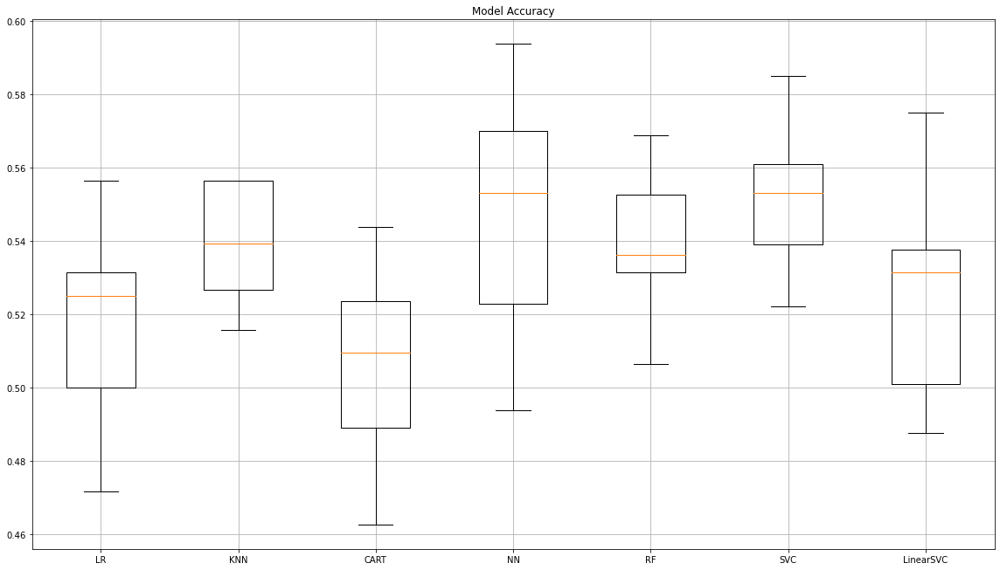

In [382]:
# Check the balance of binary classes
print(' The number of indoor recordings is ', np.count_nonzero(y_basic3))
print(' The number of outdoor recordings is ', y_basic3.size - np.count_nonzero(y_basic3))

# Data standardization
mean = X_basic3.mean(0)
sd =  X_basic3.std(0)

new_X = (X_basic3-mean)/sd
new_y = y_basic3

# Split dataset into training and test set
X_train, X_test, y_train, y_test = train_test_split(new_X, new_y, test_size=0.2, random_state=123)

# Test all specified models on validation set with 'accuracy' as quality metric
num_folds = 10 # number of validation times
seeds = 7 # random state
score = 'accuracy' # set notion of quality for cross-validation process, and use this as benchmarking
results = []
names = []

# Looping cross-val through all the initialized models
for name, model in models:
    k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
    cv = cross_val_score(model, X_train, y_train, cv=k_fold, scoring=score, error_score='raise')
    results.append(cv)
    names.append(name)
    a = (name, cv.mean(), cv.std())
    print(a)
    
# Visualize the model average accuracy after above validation
plt.figure(figsize=(16,9))

plt.boxplot(results, showfliers= False)

plt.xticks(np.arange(1,8,1), labels=names)
plt.grid()
plt.tight_layout()
plt.title('Model Accuracy')

In [384]:
# Use GridSearchCV to tune model hyperparameters

# Set all possible values for each model parameters
params = {'C': [0.001, 0.01, 0.1, 1, 3, 5],
          'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
          'gamma': ['scale', 'auto', 1, 3, 5]}

classifier =  SVC() # Initialize the classifier
clf_cv = GridSearchCV(classifier, params, cv = 10, scoring='accuracy', return_train_score=True) # Test all sets of hyperparameters with GridSearchCV, with 10-fold val
clf_cv.fit(X_train, y_train) # Fit the classifier with the best hyperparameter set on training data
result = pd.DataFrame(clf_cv.cv_results_)

print('Best hyperparameter setting: {0}.'.format(clf_cv.best_estimator_))
print('Average accuracy on validation set across folds of best hyperparameter setting: {0}.'.format(clf_cv.best_score_))
print('Average accuracy on train set across folds of best hyperparameter setting: ', float(result[result['mean_test_score'] == float(clf_cv.best_score_)]['mean_train_score'].values))

Best hyperparameter setting: SVC(C=1, gamma=3).
Average accuracy on validation set across folds of best hyperparameter setting: 0.5513286163522013.
Average accuracy on train set across folds of best hyperparameter setting:  0.7172155849226929


In [404]:
y_pred = clf_cv.predict(X_test)
print('Accuracy on training dataset: ', accuracy_score(y_train, clf_cv.predict(X_train)))
print('Accuracy on test dataset: ', accuracy_score(y_test, y_pred))

# Classification report
print('Classification report: ', classification_report(y_test, y_pred, target_names = ['outdoor', 'indoor'])) 

Accuracy on training dataset:  0.7190237797246558
Accuracy on test dataset:  0.595
Classification report:                precision    recall  f1-score   support

     outdoor       0.59      0.69      0.63       204
      indoor       0.60      0.50      0.55       196

    accuracy                           0.59       400
   macro avg       0.60      0.59      0.59       400
weighted avg       0.60      0.59      0.59       400



## Final model for Basic Componet

In [963]:
X_basic_final = X_basic3 # predictors extracting from function getXy
y_basic_final = y_basic3 # corresponding labels extracting from function getXy

# Transform
mean_basic_final = X_basic_final.mean(0)
sd_basic_final =  X_basic_final.std(0)
new_X_basic_final = (X_basic_final-mean_basic_final)/sd_basic_final
new_y_basic_final = y_basic_final

# Split data into training and test set
X_basic_train, X_basic_test, y_basic_train, y_basic_test = train_test_split(new_X_basic_final, new_y_basic_final, test_size=0.2, random_state=123)

# Initialise and fit the model with best hyperparameter
clf_basic = SVC(C=1, gamma=3).fit(X_basic_train, y_basic_train)
y_basic_pred = clf_basic.predict(X_basic_test)

print('Accuracy on test dataset: ', accuracy_score(y_basic_test, y_basic_pred))
print('Classification report: \n', classification_report(y_basic_test, y_basic_pred, zero_division=0)) #classification report
print('Confusion matrix: \n', confusion_matrix(y_basic_test, y_basic_pred))

Accuracy on test dataset:  0.595
Classification report: 
               precision    recall  f1-score   support

       False       0.59      0.69      0.63       204
        True       0.60      0.50      0.55       196

    accuracy                           0.59       400
   macro avg       0.60      0.59      0.59       400
weighted avg       0.60      0.59      0.59       400

Confusion matrix: 
 [[140  64]
 [ 98  98]]


## 7. Results
With sample size of 2000, randomly taken:
   - The final average accuracy rate is around 72% on training set
   - When being tested on test set (unseen dataset), the accuracy is nearly 60%
   
## 8. Conclusion
As can be seen from the above, it is quite clear that:
   - The performance 'accuracy' keeps being more accurate with larger sample size - the standard deviation of the score across validation keeps minimizing when increasing sample size
   - Without any model, the probability of picking either indoor or outdoor audio is around 50% (since the ratio between 2 classes is balanced), the model does improve the case by increasing the accuracy to ~60%
   - Challenges or further needed improvement:
       + Hyperparameter tuning with GridSearchCV takes too long for large search space
       + Can consider adding more feature to improve the model accuracy, the current feature set seems not to be optimal

---

# B. Advanced component
Formulate your own machine learning problem and build a machine learning solution using the MLEnd London Sounds dataset. 

## 1. Problem formulation
The problem of the basic solution is to try to predict **an area where a certain audio file was record**. So, this is a **multi- class classification problem**, whose target class (the one which we try to predict) is a variable of areas - *campus/westend/british/southbank/Euston/kensington*. </br>
To formulate the problem of basic component in a summary view with below steps:</br>
   - *Problem Input*: Audio data, acting as predictors (including the audio file and other related information such as areas or
   - *Model*: A machine learning (ML) model which would be used to predict the output from the given input </br>
   - *Problem Output*: A predicted area where the an audio was taken </br>

## 2. Machine Learning pipeline
To formulate the problem of basic component in a summary view with below steps:</br>
   - **Import input data** </br>
        + Audio file: there are total 2500 audio files (.mav), contained in 5 zip files. </br>
        + CSV file: contain data related to recording location (areas/spots/indoor or outdoor), file id and people recording the audios </br>
   - **Transformation**
       - *Feature extraction* </br>
       - *Standardization*: Standardize the data of predictors by their mean and standard deviation </br>
   - **Split data into training and test sets**: Set test size = 20% and random seed = 123 </br>
   - **Model selection** 
        + Initialize all possible models for classification problems </br> 
        + Using **accuracy** as quality notion, test each specified model on validation set </br>
   - **Optimization**: this stage can varies from approaches to approaches, some can be listed such as adding more meaningful features (predictors), handling imbalance dataset or reducing overfitting (if any)
   - **Model hyperparameter tuning**: Use GridSearch cross validation to test all possible sets of hyperparameter to find the local optimal set for the chosen model </br>
   - **Predict the class of the data object**: Produce output (predicted class) on test set; the result would be an area in which a recording was taken </br>
   - **Evaluate output**: Looking at the classification report to examine other assessing metrics of the problem </br>
   
## 3. Transformation stage
According to the above-mentioned Machine Learning pipeline, the transformation stage contains 2 steps:
 - **Feature extraction**: if we simply use the audio file itself, the model cannot understand the data we try to feed it (raw .mav file), since most of the model would accept the input in some certain types, namely numeric data, categorical data or boolean data. Therefore, we need to convert the audio files into some understandable predictors that the prediction model can process
     - Input: Audio file (.mav)
     - Output: numeric metrics, including power, pitch and voice frequency  
 - **Standardization**: The numeric features extracted from audio files can be within different scales; hence, to avoid the case that one feature of large scale could overwhelm others, we will standardize the data
     - Standardize the data of predictors by their average (mean) and standard deviation (std)
         $ Standardized_X = \frac{X - mean}{std}\\ $

## 4. Modelling
As stated, the problem in basic components is a classification one, therefore, we need to use specific models which are able to solve such a problem. There are different models which are usually used in classification problems:
   - *Ensemble/Bagging models*: RandomForest
   - *Nearest neighbor models*: K-neighbor
   - *Logistic regression model*
   - *Neural network model*
   - *Tree model*: DecisionTree
   
To decide which one suits best, we will use a heuristic approach by testing each model on the specified validation set to see which model generate the best quality metric, which would be 'accuracy' in this case.

## 5. Methodology
Before going to the training and validation stage, we need to ensure these steps being done:
 - Finish importing audio data
 - Finish transformation
 - Split the dataset into training set and test set

Then, what we need to do is to decide which model and which hyperparameter set work best on the fed train and validation data. **The methodology used here is to try all possible models or hyperparameter sets we could think of**.

For model selection, the K-fold cross-validation method would be used with each initialized models. The training set will be divided into train and validation set: each model will be trained with train set and validated by the validation set
    - For each model, the validation be run *k times* (aka k-fold)
    - To compare one model to another, we will use average '**accuracy**' score as notion of quality to benchmark (each time of validation will generate one accuracy score; after k times, we will calculate the average score)
    
After finish selecting the suitable model, to determine the optimal set of model hyperparameters, the similar approach would be applied. To save time, we could use the **GridSearchCV** method, which allows us to run through all possible hyperparameters we suspect and find out the best set with the highest average accuracy. GridSeachCV will also divide training set into train and validation set, then the train data will be fed to the chosen model and the validation set will be used to validate the model performance. For each set of hyperparameters, the validation will also go through k-times and we will also use average 'accuracy' score as our benchmark.

For final evaluation on test set, we can still look at **accuracy score**. However, since this is a multi-class classification, we may want to look at **f1-score** of each class as well, especially classes of minority (when imbalance presents) - this can be achieved by using classification report in sklearn.

## 6. Dataset
The dataset includes 2 sources:
   - Audio files: 
        - There are 2500 .mav files recorded by students in different areas/spots around London, UK
        - Each audio is around 7 second length on average
        - All the audio files is split into 5 zip files, which could be uploaded to google drive, and then mounted by google colab
   - CSV file:
       - The file contains 2500 data rows
       - It has 5 columns: file_id, area, spot, in_out, participant
       
The target classes (column in_out in the CSV file) looks quite **imbalance** among 'area' values - campus, westend and british are overwhelming other classes

## 7. Strategy + Code Snippets
Phase 1: Process and build the model as similarly as what has been done so far with basic component</br>
Phase 2: Try adding more features </br>
Phase 3: Deal with imbalance issue

### Phase 1: Implement similar approach used in basic solution

Modify function of feature extract, especially to get the correct target class for advanced component - '**area**'.

In [178]:
def getPitch1(x,fs,winLen=0.02, min_freq=80, max_freq=450):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=min_freq, fmax=max_freq, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

def getXy1(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('\\')[-1]
    file_name = file.split('\\')[-1]
    yi = labels_file.loc[fileID]['area'] # The target class is now 'area'

    fs = None
    x, fs = librosa.load(file,sr=fs)
    if np.sum(x) == 0:
        pass
    else:
        if scale_audio: x = x/np.max(np.abs(x))
        f0, voiced_flag = getPitch1(x,fs,winLen=0.02) # wider range of frequency
#         f1, voiced_flag1 = getPitch1(x,fs,winLen=0.02, min_freq=451, max_freq=2093) # higher range of frequency

        power = np.sum(x**2)/len(x)
        pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
        pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
        voiced_fr = np.mean(voiced_flag)

        xi = [power,pitch_mean,pitch_std,voiced_fr]
        X.append(xi)
        y.append(yi)

  return np.array(X),np.array(y)

Similar to basic solutions, extract features and labels for different sample size and plot the distribution of classes within each case

In [385]:
# From 500 sampled audio set
X_advance1, y_advance1 = getXy1(np.array([files[i] for i in np.random.choice(range(2500),500,replace=False)]), labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)
# From 1000 sampled audio set
X_advance2, y_advance2 = getXy1(np.array([files[i] for i in np.random.choice(range(2500),1000,replace=False)]), labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)
# From 2000 sampled audio set
X_advance3, y_advance3 = getXy1(np.array([files[i] for i in np.random.choice(range(2500),2000,replace=False)]), labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)
# All sampled audio set
X_advance5, y_advance5 = getXy1(files, labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [51:17<00:00,  1.23s/it]


In [444]:
print('The shape of X1, y1 is', X_advance1.shape, y_advance1.shape) 
print('The shape of X2, y2 is', X_advance2.shape, y_advance2.shape)
print('The shape of X3, y3 is', X_advance3.shape, y_advance3.shape)
print('The shape of X5, y5 is', X_advance5.shape, y_advance5.shape)

The shape of X1, y1 is (500, 4) (500,)
The shape of X2, y2 is (1000, 4) (1000,)
The shape of X3, y3 is (1998, 4) (1998,)
The shape of X5, y5 is (2498, 4) (2498,)


Analyze the data of target classes

It can be easily seen that there is visible skewness among different areas, with largest number of audio being attributed to 'campus' and lowest to 'kensington'

The ratio between the number of campus recordings and that of kensington one is 6:1

campus        181
westend       138
british        72
southbank      45
Euston         41
kensington     23
Name: class, dtype: int64

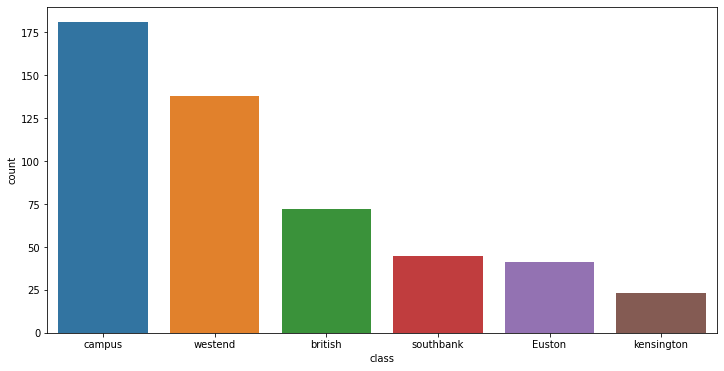

In [777]:
df1 = pd.DataFrame(X_advance1, columns=['power','pitch_mean','pitch_std','voiced_fr'])
df1['class'] = y_advance1
sns.countplot(data=df1, x='class', order = ['campus', 'westend', 'british', 'southbank', 'Euston', 'kensington'])
df1['class'].value_counts()

campus        335
westend       263
british       158
Euston         95
southbank      90
kensington     59
Name: class, dtype: int64

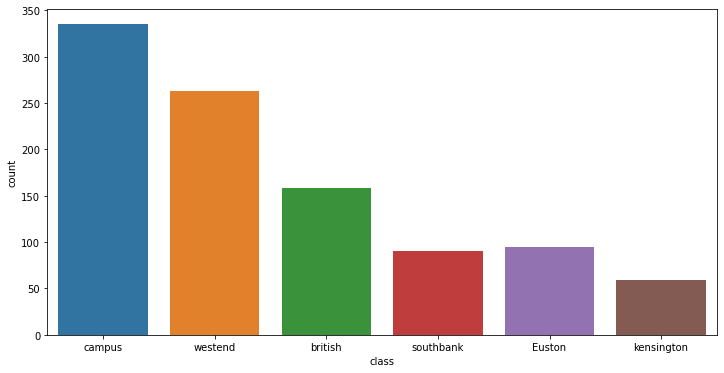

In [778]:
df2 = pd.DataFrame(X_advance2, columns=['power','pitch_mean','pitch_std','voiced_fr'])
df2['class'] = y_advance2
sns.countplot(data=df2, x='class', order = ['campus', 'westend', 'british', 'southbank', 'Euston', 'kensington'])
df2['class'].value_counts()

campus        672
westend       528
british       312
Euston        191
southbank     183
kensington    112
Name: class, dtype: int64

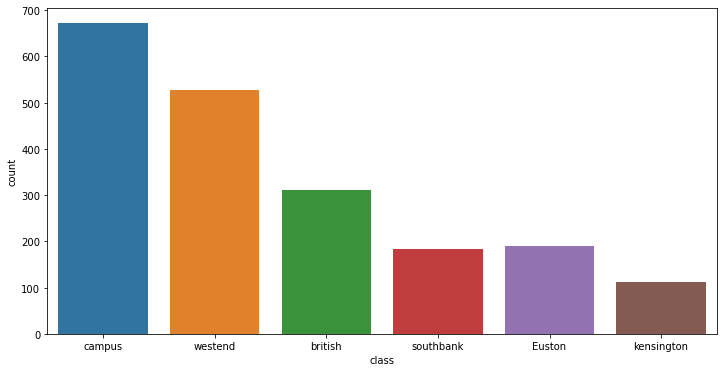

In [779]:
df3 = pd.DataFrame(X_advance3, columns=['power','pitch_mean','pitch_std','voiced_fr'])
df3['class'] = y_advance3
sns.countplot(data=df3, x='class', order = ['campus', 'westend', 'british', 'southbank', 'Euston', 'kensington'])
df3['class'].value_counts()

Standardization stage

In [893]:
X1 = df1[['power','pitch_mean','pitch_std','voiced_fr']].fillna(0).values.astype(np.float64)
mean1 = X1.mean(0)
sd1 =  X1.std(0)
new_X1 = (X1-mean1)/sd1
new_y1 = y_advance1

X2 = df2[['power','pitch_mean','pitch_std','voiced_fr']].fillna(0).values.astype(np.float64)
mean2 = X2.mean(0)
sd2 =  X2.std(0)
new_X2 = (X2-mean2)/sd2
new_y2 = y_advance2

X3 = df3[['power','pitch_mean','pitch_std','voiced_fr']].fillna(0).values.astype(np.float64)
mean3 = X3.mean(0)
sd3 =  X3.std(0)
new_X3 = (X3-mean3)/sd3
new_y3 = y_advance3

X5 = df5[['power','pitch_mean','pitch_std','voiced_fr']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance5

Split the dataset of different sample sizes into training and test set

In [894]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(new_X1, new_y1, test_size=0.2, random_state=123)
X_train2, X_test2, y_train2, y_test2 = train_test_split(new_X2, new_y2, test_size=0.2, random_state=123)
X_train3, X_test3, y_train3, y_test3 = train_test_split(new_X3, new_y3, test_size=0.2, random_state=123)
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)

Model selection and test all models with increasing sample size (500-1000-2000-all) by using K-fold cross validation

In [465]:
# spot check algorithms
models = []

# Ensable Models 
models.append(('LR', LogisticRegression()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))

# Neural Network
models.append(('NN', MLPClassifier()))

# Bagging methods
models.append(('RF', RandomForestClassifier()))

# SVM method
models.append(('SVC', SVC()))
models.append(('LinearSVC', LinearSVC()))

In [466]:
# Sample size = 500
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action = "ignore", category=ConvergenceWarning)

num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []

for name, model in models:
    k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
    cv = cross_val_score(model, X_train1, y_train1, cv=k_fold, scoring=score, error_score='raise')
    results.append(cv)
    names.append(name)
    a = (name, cv.mean(), cv.std())
    print(a)

('LR', 0.3575, 0.06712860791048776)
('KNN', 0.3175, 0.07335700375560604)
('CART', 0.325, 0.059160797830996155)
('NN', 0.34500000000000003, 0.06403124237432847)
('RF', 0.34750000000000003, 0.07198090024443984)
('SVC', 0.365, 0.060415229867972854)
('LinearSVC', 0.3525, 0.06368869601428498)


In [467]:
# Sample size = 1000
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []

for name, model in models:
    k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
    cv = cross_val_score(model, X_train2, y_train2, cv=k_fold, scoring=score, error_score='raise')
    results.append(cv)
    names.append(name)
    a = (name, cv.mean(), cv.std())
    print(a)

('LR', 0.33999999999999997, 0.04930770730829005)
('KNN', 0.29500000000000004, 0.03269174207655505)
('CART', 0.24500000000000002, 0.050062460986251965)
('NN', 0.3375, 0.03400367627183861)
('RF', 0.3025, 0.035707142142714254)
('SVC', 0.3375, 0.03791437722025776)
('LinearSVC', 0.33625, 0.047582165776685705)


In [468]:
# Sample size = 2000
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []

for name, model in models:
    k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
    cv = cross_val_score(model, X_train3, y_train3, cv=k_fold, scoring=score, error_score='raise')
    results.append(cv)
    names.append(name)
    a = (name, cv.mean(), cv.std())
    print(a)

('LR', 0.3804559748427673, 0.024829757360861675)
('KNN', 0.3115880503144654, 0.03164662564630981)
('CART', 0.2559473270440252, 0.03326836076363564)
('NN', 0.3648427672955975, 0.014581322226516431)
('RF', 0.33289701257861637, 0.02948045832563453)
('SVC', 0.370440251572327, 0.031947851616261534)
('LinearSVC', 0.37732311320754713, 0.02481169596062683)


In [897]:
# Sample size = all
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []

for name, model in models:
    k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
    cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
    results.append(cv)
    names.append(name)
    a = (name, cv.mean(), cv.std())
    print(a)

('LR', 0.37536432160804023, 0.03318788144962352)
('KNN', 0.29730904522613066, 0.025465449340694567)
('CART', 0.2657613065326633, 0.020972607434928802)
('NN', 0.3843793969849246, 0.030745092812548495)
('RF', 0.32831407035175886, 0.03159402316403217)
('SVC', 0.374856783919598, 0.022669251944264345)
('LinearSVC', 0.3758668341708543, 0.03201694475816963)


Text(0.5, 1.0, 'Model Accuracy')

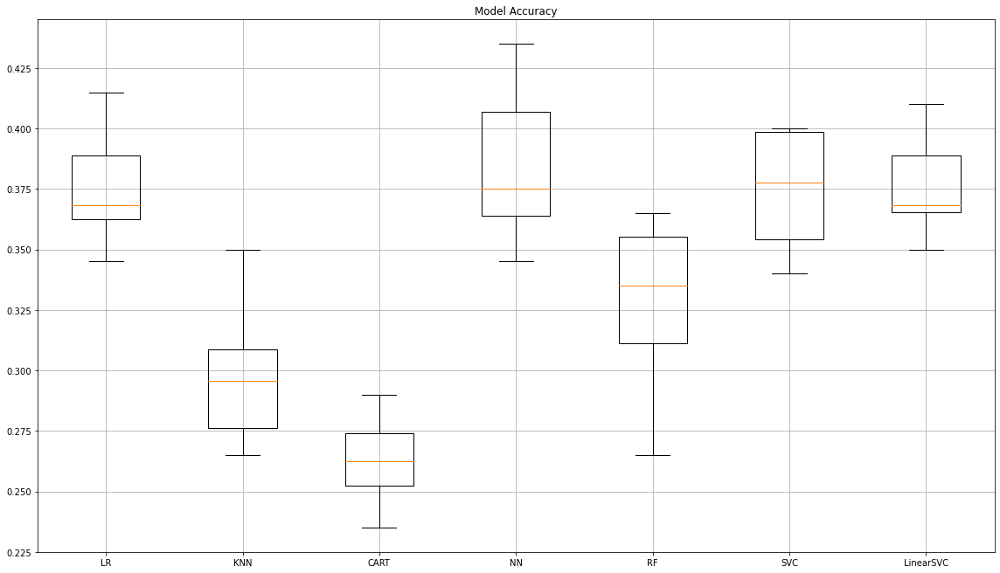

In [898]:
# Visualize the model average accuracy after above validation
plt.figure(figsize=(16,9))

plt.boxplot(results, showfliers= False)

plt.xticks(np.arange(1,8,1), labels=names)
plt.grid()
plt.tight_layout()
plt.title('Model Accuracy')

The result is quite inline with what we see in the basic part: the large the sample size is, the better the model becomes, though still not good enough (this will be optimized in later phases). And **SVC** still tends to be a good fit in this case.

With SVC(), the current accuracy after K-FoldCV is ~37.5%

### Phase 2: Adding more features

Modify the function used for feature extraction to get more features from audio (mostly taken from librosa library)

In [219]:
def getXy2(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('\\')[-1]
    file_name = file.split('\\')[-1]
    yi = labels_file.loc[fileID]['area'] # The target class is now 'area'

    fs = None
    x, fs = librosa.load(file,sr=fs)
    if np.sum(x) == 0:
        pass
    else:
        if scale_audio: x = x/np.max(np.abs(x))
        f0, voiced_flag = getPitch1(x,fs,winLen=0.02) # wider range of frequency
        chromagram_stft = librosa.feature.chroma_stft(y=x, sr=fs)
        chromagram_q = librosa.feature.chroma_cqt(y=x, sr=fs)
        chromagram_cen = librosa.feature.chroma_cens(y=x, sr=fs)
        melspec = librosa.feature.melspectrogram(y=x, sr=fs)
        mfcc = librosa.feature.mfcc(y=x, sr=fs)
        spectral_centroid = librosa.feature.spectral_centroid(y=x, sr=fs)
        spectral_bandwidth = librosa.feature.spectral_bandwidth(y=x, sr=fs)
        spectral_contrast = librosa.feature.spectral_contrast(y=x, sr=fs)
        spectral_rolloff = librosa.feature.spectral_rolloff(y=x, sr=fs)
        tonal_centroid = librosa.feature.tonnetz(y=x, sr=fs)
        zero_crossing_rate = librosa.feature.zero_crossing_rate(y=x)

        power = np.sum(x**2)/len(x)
        pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
        pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
        pitch1_med = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
        pitch1_95th  = np.nanpercentile(f0, 5) if np.mean(np.isnan(f0))<1 else 0
        pitch1_5th = np.nanpercentile(f0, 95) if np.mean(np.isnan(f0))<1 else 0
        voiced_fr = np.mean(voiced_flag)
        chromagram_stft_mean = np.nanmean(chromagram_stft)
        chromagram_stft_std = np.nanstd(chromagram_stft)
        chromagram_q_mean = np.nanmean(chromagram_q)
        chromagram_q_std = np.nanstd(chromagram_q)
        chromagram_cen_mean = np.nanmean(chromagram_cen)
        chromagram_cen_std = np.nanstd(chromagram_cen)
        melspec_mean = np.nanmean(melspec)
        melspec_std = np.nanstd(melspec)
        mfcc_mean = np.nanmean(mfcc)
        mfcc_std = np.nanstd(mfcc)
        spectral_centroid_mean = np.nanmean(spectral_centroid)
        spectral_centroid_std = np.nanstd(spectral_centroid)
        spectral_bandwidth_mean = np.nanmean(spectral_bandwidth)
        spectral_bandwidth_std = np.nanstd(spectral_bandwidth)
        spectral_contrast_mean = np.nanmean(spectral_contrast)
        spectral_contrast_std = np.nanstd(spectral_contrast)
        spectral_rolloff_mean = np.nanmean(spectral_rolloff)
        spectral_rolloff_std = np.nanstd(spectral_rolloff)
        tonal_centroid_mean = np.nanmean(tonal_centroid)
        tonal_centroid_std = np.nanstd(tonal_centroid)
        zero_crossing_rate_mean = np.nanmean(zero_crossing_rate)
        zero_crossing_rate_std = np.nanstd(zero_crossing_rate)
        in_out = labels_file.loc[fileID]['in_out']

        xi = [power,pitch_mean,pitch_std,pitch1_med,pitch1_95th,pitch1_5th,voiced_fr,chromagram_stft_mean,chromagram_stft_std,chromagram_q_mean,chromagram_q_std,chromagram_cen_mean,chromagram_cen_std,melspec_mean,melspec_std,mfcc_mean,mfcc_std,spectral_centroid_mean,spectral_centroid_std,spectral_bandwidth_mean,spectral_bandwidth_std,spectral_contrast_mean,spectral_contrast_std,spectral_rolloff_mean,spectral_rolloff_std,tonal_centroid_mean,tonal_centroid_std,zero_crossing_rate_mean,zero_crossing_rate_std,in_out]
        X.append(xi)
        y.append(yi)

  return np.array(X),np.array(y)

Extract features and labels for all samples with new feature extracting function

In [232]:
# Get new feature set and corresponding labels for ALL samples
X_advance4, y_advance4 = getXy2(files, labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

 83%|██████████████████████████████████████████████████████████████▉             | 2070/2500 [1:19:47<15:15,  2.13s/it]C:\Users\ASUS\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=889
  return f(*args, **kwargs)
100%|████████████████████████████████████████████████████████████████████████████| 2500/2500 [1:36:14<00:00,  2.31s/it]


campus        822
westend       666
british       404
Euston        234
southbank     229
kensington    143
Name: class, dtype: int64

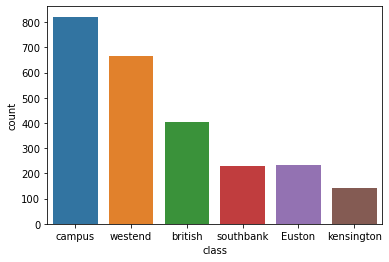

In [448]:
df4 = pd.DataFrame(X_advance4, columns=['power','pitch_mean','pitch_std','pitch1_med','pitch1_95th','pitch1_5th','voiced_fr','chromagram_stft_mean','chromagram_stft_std','chromagram_q_mean','chromagram_q_std','chromagram_cen_mean','chromagram_cen_std','melspec_mean','melspec_std','mfcc_mean','mfcc_std','spectral_centroid_mean','spectral_centroid_std','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','spectral_rolloff_std','tonal_centroid_mean','tonal_centroid_std','zero_crossing_rate_mean','zero_crossing_rate_std','in_out'])
df4['in_out'] = df4['in_out'].apply(lambda x: (x=='indoor')*0 + (x=='outdoor')*1) # Hot encoding
df4 = df4.astype('float') # Convert dtype

df4['class'] = y_advance4

Check correlation among predictors by heatmap

<AxesSubplot:>

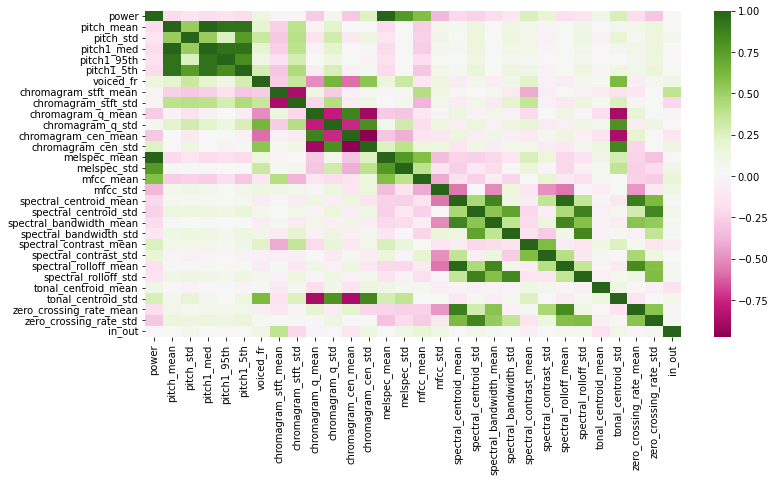

In [781]:
sns.heatmap(df4.corr(), cmap="PiYG")

Based on feature heatmap, some features are highly correlated to each other, which may adversely impact our model performance if use both, we may just want to use 1 of them; therefore, we need to come up with a way for **feature selection**

We will use K-foldCV to test each added feature individually to estimate its impact when added. Our base features would be the 4 features we use in Phase 1, including: power, pitch_mean, pitch_std, voiced_fr (we will leave this as 'origin')

In [901]:
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
feature = ["origin",'pitch1_med','pitch1_95th','pitch1_5th','chromagram_stft_mean','chromagram_stft_std','chromagram_q_mean','chromagram_q_std','chromagram_cen_mean','chromagram_cen_std','melspec_mean','melspec_std','mfcc_mean','mfcc_std','spectral_centroid_mean','spectral_centroid_std','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','spectral_rolloff_std','tonal_centroid_mean','tonal_centroid_std','zero_crossing_rate_mean','zero_crossing_rate_std','in_out']

for i in feature:
    model = SVC()
    if i == 'origin':
        X4 = df4[['power','pitch_mean','pitch_std','voiced_fr']].fillna(0).values.astype(np.float64)
    else:
        X4 = df4[['power','pitch_mean','pitch_std','voiced_fr',i]].fillna(0).values.astype(np.float64)
    mean4 = X4.mean(0)
    sd4 =  X4.std(0)
    new_X4 = (X4-mean4)/sd4
    new_y4 = y_advance4
    X_train4, X_test4, y_train4, y_test4 = train_test_split(new_X4, new_y4, test_size=0.2, random_state=123)
    k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
    cv = cross_val_score(model, X_train4, y_train4, cv=k_fold, scoring=score, error_score='raise')
    results.append(cv)
    names.append(name)
    a = (name, cv.mean(), cv.std())
    print("Add ", i, "; accuracy on val (mean, std): ", a)

Add  origin ; accuracy on val (mean, std):  ('LinearSVC', 0.374856783919598, 0.022669251944264345)
Add  pitch1_med ; accuracy on val (mean, std):  ('LinearSVC', 0.37485929648241206, 0.02098959003472947)
Add  pitch1_95th ; accuracy on val (mean, std):  ('LinearSVC', 0.37535929648241206, 0.022537825834441142)
Add  pitch1_5th ; accuracy on val (mean, std):  ('LinearSVC', 0.37586934673366834, 0.01954222900999071)
Add  chromagram_stft_mean ; accuracy on val (mean, std):  ('LinearSVC', 0.38336934673366835, 0.023784722909097104)
Add  chromagram_stft_std ; accuracy on val (mean, std):  ('LinearSVC', 0.3728668341708543, 0.02657603726428776)
Add  chromagram_q_mean ; accuracy on val (mean, std):  ('LinearSVC', 0.3768567839195979, 0.026653657732446805)
Add  chromagram_q_std ; accuracy on val (mean, std):  ('LinearSVC', 0.375856783919598, 0.02425245174973732)
Add  chromagram_cen_mean ; accuracy on val (mean, std):  ('LinearSVC', 0.37335929648241206, 0.022369416158524367)
Add  chromagram_cen_std ; a

After testing on validation, below is some potential features which may help to lift up the performance: 
   - 'pitch1_95th', 'pitch1_5th'
   - 'chromagram_stft_mean'
   - 'chromagram_q_mean', 'chromagram_q_std'
   - 'mfcc_mean', 'mfcc_std'
   - 'spectral_centroid_mean','spectral_centroid_std'
   - 'spectral_bandwidth_mean','spectral_bandwidth_std'
   - 'spectral_contrast_mean','spectral_contrast_std'
   - 'spectral_rolloff_mean','spectral_rolloff_std'
   - 'tonal_centroid_mean','tonal_centroid_std'
   - 'zero_crossing_rate_mean','zero_crossing_rate_std'
   - 'in_out'

**The plan for this is gradually incorporate each feature into the training dataset; after testing with K-foldCV, based on the returned score, we will keep the feature generating the score higher than the previous, otherwise, get rid of it.**

In [574]:
# Orginal set of features
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.374856783919598, 0.022669251944264345)


Add 'pitch1_95th' ==> Better score: keep the feature

In [575]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.37535929648241206, 0.022537825834441142)


Add 'pitch1_5th' ==> Better score: keep the feature

In [576]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.37586180904522615, 0.022947939346584893)


Add 'chromagram_stft_mean' ==> Better score: keep the feature

In [577]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.3828718592964824, 0.018376837186968233)


Add 'chromagram_q_mean' ==> Better score: keep the feature

In [477]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.39586934673366836, 0.027876959040257398)


Add 'chromagram_q_std' ==> Better score: keep the feature

In [478]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.411394472361809, 0.035641854831970174)


Add 'mfcc_mean' ==> Better score: keep the feature

In [479]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.41839195979899496, 0.031059053127749956)


Add 'mfcc_std' ==> Better score: keep the feature

In [480]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.4239195979899497, 0.02891248291641886)


Add 'spectral_centroid_mean' ==> Better score: keep the feature

In [481]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.4334522613065327, 0.039017900451491935)


Add 'spectral_centroid_std' ==> Lower score: Remove the feature

In [482]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_centroid_std']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.42892462311557783, 0.034653835807210834)


Add 'spectral_bandwidth_mean' ==> Better score: Keep the feature

In [483]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.4369547738693467, 0.03500917930039188)


Add 'spectral_bandwidth_std' ==> Better score: Keep the feature

In [484]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.4429547738693468, 0.03723151016081442)


Add 'spectral_contrast_mean' ==> Better score: Keep the feature

In [485]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.44495477386934673, 0.03662477035684765)


Add 'spectral_contrast_std' ==> Better score: Keep the feature

In [486]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.44696482412060307, 0.03839039401947946)


Add 'spectral_rolloff_mean' ==> Better score: Keep the feature

In [487]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.45597487437185935, 0.035781530096024784)


Add 'spectral_rolloff_std' ==> Lower score: Remove the feature

In [488]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','spectral_rolloff_std']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.4539773869346734, 0.0332858629034238)


Add 'tonal_centroid_mean' ==> Lower score: Remove the feature

In [489]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','tonal_centroid_mean']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.4469698492462312, 0.034955498083874596)


Add 'tonal_centroid_std' ==> Lower score: Remove the feature

In [490]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','tonal_centroid_std']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.45496984924623113, 0.035452405186520916)


Add 'zero_crossing_rate_mean' ==> Lower score: Remove the feature

In [491]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','zero_crossing_rate_mean']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.4534698492462311, 0.03502183327712522)


Add 'zero_crossing_rate_std' ==> Not better score: Remove the feature

In [492]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','zero_crossing_rate_std']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.45597487437185935, 0.03611663191287055)


Add 'in_out' ==> Better score: Keep the feature

In [952]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X5 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','in_out']].fillna(0).values.astype(np.float64)
mean5 = X5.mean(0)
sd5 =  X5.std(0)
new_X5 = (X5-mean5)/sd5
new_y5 = y_advance4
X_train5, X_test5, y_train5, y_test5 = train_test_split(new_X5, new_y5, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.48898241206030146, 0.037029772367172434)


**The final feature set would include:**
   - 'power', 'pitch_mean', 'pitch_std', 'voiced_fr' *(base feature set)*
   - 'pitch1_95th', 
   - 'pitch1_5th', 
   - 'chromagram_stft_mean', 
   - 'chromagram_q_mean', 
   - 'chromagram_q_std', 
   - 'mfcc_mean', 
   - 'mfcc_std',
   - 'spectral_centroid_mean'
   - 'spectral_bandwidth_mean'
   - 'spectral_bandwidth_std'
   - 'spectral_contrast_mean'
   - 'spectral_contrast_std'
   - 'spectral_rolloff_mean'
   - 'in_out'

With these features incorporated into the model, the accuracy on validation set by using K-foldCV has increased from ~37% to ~49%

In [911]:
model.fit(X_train5, y_train5)
y_pred = model.predict(X_test5)

print('Accuracy on training dataset: ', accuracy_score(y_train5, model.predict(X_train5)))
print('Accuracy on test dataset: ', accuracy_score(y_test5, y_pred))
print('Classification report: \n', classification_report(y_test5, y_pred)) #classification report

Accuracy on training dataset:  0.5875875875875876
Accuracy on test dataset:  0.434
Classification report: 
               precision    recall  f1-score   support

      Euston       0.20      0.02      0.04        46
     british       0.32      0.13      0.18        94
      campus       0.44      0.84      0.57       140
  kensington       1.00      0.03      0.06        31
   southbank       0.32      0.12      0.17        51
     westend       0.47      0.58      0.52       138

    accuracy                           0.43       500
   macro avg       0.46      0.29      0.26       500
weighted avg       0.43      0.43      0.36       500



([<matplotlib.axis.YTick at 0x181ff738850>,
 [Text(0, 0, 'Euston'),
  Text(0, 1, 'british'),
  Text(0, 2, 'campus'),
  Text(0, 3, 'kensington'),
  Text(0, 4, 'southbank'),
  Text(0, 5, 'westend')])

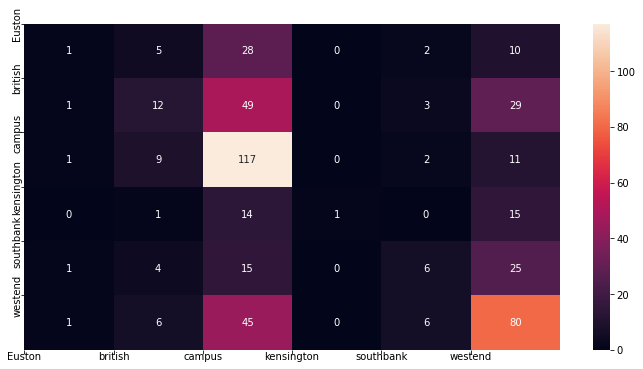

In [904]:
cm=confusion_matrix(y_test5, y_pred)
sns.heatmap(cm, annot=True, fmt='g')
plt.xticks(ticks=np.array([0,1,2,3,4,5]),labels=np.array(['Euston', 'british', 'campus', 'kensington', 'southbank', 'westend']), ha='center', va='center')
plt.yticks(ticks=np.array([0,1,2,3,4,5]),labels=np.array(['Euston', 'british', 'campus', 'kensington', 'southbank', 'westend']), ha='center', va='center')

The confusion matrix above show that the model tends to predict an area as either 'campus' or 'westend' (classes of majority), while very few number are predicted in other classes (classes of minority)

In [905]:
# num_folds = 50
# seeds = 7
# score = 'accuracy'
# results = []
# k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
# cv = cross_val_score(model, X_train5, y_train5, cv=k_fold, scoring=score, error_score='raise')
# results.append(cv)
# a = (cv.mean(), cv.std())
# print(a)

In [906]:
# print('Accuracy on training dataset: ', accuracy_score(y_train5, model.predict(X_train5)))
# print('Accuracy on test dataset: ', accuracy_score(y_test5, model.predict(X_test5)))
# print(classification_report(y_test5, model.predict(X_test5)))
# print(confusion_matrix(y_test5, model.predict(X_test5), labels = ['Euston', 'british', 'campus', 'kensington', 'southbank', 'westend']))

### Phase 3: Handle imbalance dataset
4 ways:
   - Undersampling on training set
   - Oversampling on training set
   - RandomForestClassifier
   - Assign class_weight to the model

campus        682
westend       528
british       310
Euston        188
southbank     178
kensington    112
Name: class, dtype: int64

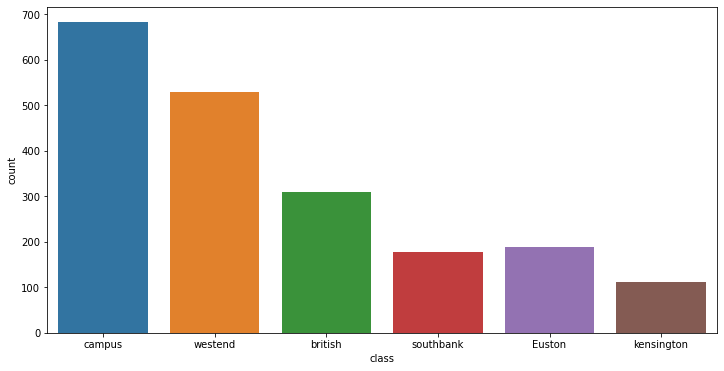

In [754]:
df5a = pd.DataFrame(X_train5, columns=['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','in_out'])
df5a['class'] = y_train5
sns.countplot(data=df5a, x='class', order = ['campus', 'westend', 'british', 'southbank', 'Euston', 'kensington'])
df5a['class'].value_counts()

**Undersampling**: decrease the major classes to balance the dataset

In [912]:
british=df5a[df5a['class'] == 'british'].sample(df5a['class'].value_counts().min(), replace=False, random_state= 42)
euston=df5a[df5a['class'] == 'Euston'].sample(df5a['class'].value_counts().min(), replace=False, random_state= 42)
southbank=df5a[df5a['class'] == 'southbank'].sample(df5a['class'].value_counts().min(), replace=False, random_state= 42)
kensington=df5a[df5a['class'] == 'kensington'].sample(df5a['class'].value_counts().min(), replace=False, random_state= 42)
campus=df5a[df5a['class'] == 'campus'].sample(df5a['class'].value_counts().min(), replace=False, random_state= 42)
westend=df5a[df5a['class'] == 'westend'].sample(df5a['class'].value_counts().min(), replace=False, random_state= 42)

In [913]:
df7 = pd.concat([british, euston, southbank, kensington, campus, westend]).sample(frac=1, random_state=21)
df7.shape

(672, 19)

campus        112
british       112
southbank     112
westend       112
Euston        112
kensington    112
Name: class, dtype: int64

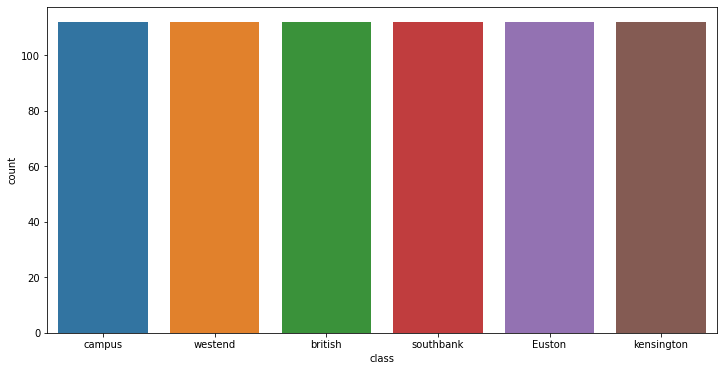

In [914]:
sns.countplot(data=df7, x='class', order = ['campus', 'westend', 'british', 'southbank', 'Euston', 'kensington'])
df7['class'].value_counts()

In [915]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
names = []
X_train7 = df7.drop(columns='class').fillna(0).values.astype(np.float64)
y_train7 = df7['class'].values
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train7, y_train7, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
names.append(name)
a = (name, cv.mean(), cv.std())
print(a)

('LinearSVC', 0.41378402107111506, 0.03902158446672077)


In [916]:
model = SVC()
model.fit(X_train7, y_train7)
y_pred = model.predict(X_test5)

print('Accuracy on oversampled training dataset: ', accuracy_score(y_train7, model.predict(X_train7)))
print('Accuracy on training dataset: ', accuracy_score(y_train5, model.predict(X_train5)))
print('Accuracy on test dataset: ', accuracy_score(y_test5, y_pred))
print('Classification report: \n', classification_report(y_test5, y_pred)) #classification report

Accuracy on oversampled training dataset:  0.6175595238095238
Accuracy on training dataset:  0.44594594594594594
Accuracy on test dataset:  0.318
Classification report: 
               precision    recall  f1-score   support

      Euston       0.17      0.30      0.22        46
     british       0.34      0.20      0.25        94
      campus       0.46      0.31      0.37       140
  kensington       0.18      0.45      0.26        31
   southbank       0.23      0.37      0.29        51
     westend       0.45      0.36      0.40       138

    accuracy                           0.32       500
   macro avg       0.31      0.33      0.30       500
weighted avg       0.37      0.32      0.33       500



**Oversampling**: increase the minor classes to balance the dataset

In [917]:
british=df5a[df5a['class'] == 'british'].sample(df5a['class'].value_counts().max(), replace=True, random_state= 42)
euston=df5a[df5a['class'] == 'Euston'].sample(df5a['class'].value_counts().max(), replace=True, random_state= 42)
southbank=df5a[df5a['class'] == 'southbank'].sample(df5a['class'].value_counts().max(), replace=True, random_state= 42)
kensington=df5a[df5a['class'] == 'kensington'].sample(df5a['class'].value_counts().max(), replace=True, random_state= 42)
campus=df5a[df5a['class'] == 'campus'].sample(df5a['class'].value_counts().max(), replace=False, random_state= 42)
westend=df5a[df5a['class'] == 'westend'].sample(df5a['class'].value_counts().max(), replace=True, random_state= 42)

In [918]:
df6 = pd.concat([british, euston, southbank, kensington, campus, westend]).sample(frac=1, random_state=21)
df6.shape

(4092, 19)

Euston        682
southbank     682
british       682
campus        682
westend       682
kensington    682
Name: class, dtype: int64

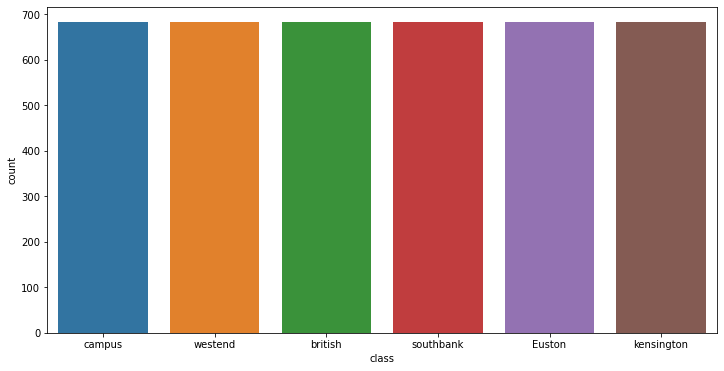

In [919]:
sns.countplot(data=df6, x='class', order = ['campus', 'westend', 'british', 'southbank', 'Euston', 'kensington'])
df6['class'].value_counts()

In [920]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
X_train6 = df6.drop(columns='class').fillna(0).values.astype(np.float64)
y_train6 = df6['class'].values
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train6, y_train6, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
a = (cv.mean(), cv.std())
print(a)

(0.6439429900411473, 0.03275885324061636)


In [925]:
model = SVC()
model.fit(X_train6, y_train6)
y_pred = model.predict(X_test5)

print('Accuracy on oversampled training dataset: ', accuracy_score(y_train6, model.predict(X_train6)))
print('Accuracy on training dataset: ', accuracy_score(y_train5, model.predict(X_train5)))
print('Accuracy on test dataset: ', accuracy_score(y_test5, y_pred))
print('Classification report: \n', classification_report(y_test5, y_pred)) #classification report

Accuracy on oversampled training dataset:  0.7304496578690127
Accuracy on training dataset:  0.6256256256256256
Accuracy on test dataset:  0.368
Classification report: 
               precision    recall  f1-score   support

      Euston       0.15      0.22      0.18        46
     british       0.35      0.29      0.32        94
      campus       0.46      0.40      0.43       140
  kensington       0.30      0.52      0.38        31
   southbank       0.23      0.31      0.27        51
     westend       0.53      0.43      0.47       138

    accuracy                           0.37       500
   macro avg       0.34      0.36      0.34       500
weighted avg       0.40      0.37      0.38       500



Combine both Undersampling and Oversampling (by using SMOTETomek library) </br>
Use RandomForestClassifier and SVC model

In [926]:
!pip install imblearn
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks

In [935]:
# Define SMOTE-Tomek Links
resample=SMOTETomek(tomek=TomekLinks(sampling_strategy='majority'))
X_train6, y_train6 = resample.fit_resample(X_train5, y_train5)

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='count'>

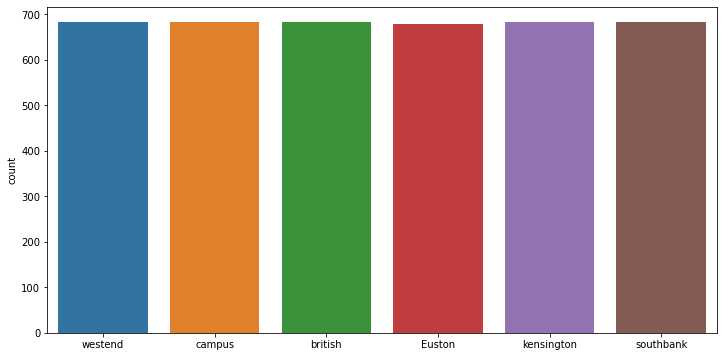

In [936]:
sns.countplot(y_train6)

In [937]:
model = SVC()
model.fit(X_train6, y_train6)
y_pred = model.predict(X_test5)

print('Accuracy on oversampled training dataset: ', accuracy_score(y_train6, model.predict(X_train6)))
print('Accuracy on training dataset: ', accuracy_score(y_train5, model.predict(X_train5)))
print('Accuracy on test dataset: ', accuracy_score(y_test5, y_pred))
print('Classification report: \n', classification_report(y_test5, y_pred)) #classification report

Accuracy on oversampled training dataset:  0.7132370932224126
Accuracy on training dataset:  0.6301301301301301
Accuracy on test dataset:  0.37
Classification report: 
               precision    recall  f1-score   support

      Euston       0.17      0.26      0.21        46
     british       0.34      0.30      0.32        94
      campus       0.51      0.41      0.46       140
  kensington       0.23      0.35      0.28        31
   southbank       0.26      0.37      0.30        51
     westend       0.52      0.41      0.46       138

    accuracy                           0.37       500
   macro avg       0.34      0.35      0.34       500
weighted avg       0.40      0.37      0.38       500



In [942]:
model = RandomForestClassifier()
model.fit(X_train6, y_train6)
y_pred = model.predict(X_test5)

print('Accuracy on oversampled training dataset: ', accuracy_score(y_train6, model.predict(X_train6)))
print('Accuracy on training dataset: ', accuracy_score(y_train5, model.predict(X_train5)))
print('Accuracy on test dataset: ', accuracy_score(y_test5, y_pred))
print('Classification report: \n', classification_report(y_test5, y_pred)) #classification report

Accuracy on oversampled training dataset:  1.0
Accuracy on training dataset:  0.998998998998999
Accuracy on test dataset:  0.39
Classification report: 
               precision    recall  f1-score   support

      Euston       0.24      0.28      0.26        46
     british       0.35      0.28      0.31        94
      campus       0.48      0.51      0.49       140
  kensington       0.24      0.32      0.28        31
   southbank       0.23      0.27      0.25        51
     westend       0.50      0.44      0.47       138

    accuracy                           0.39       500
   macro avg       0.34      0.35      0.34       500
weighted avg       0.40      0.39      0.39       500



**Use balance 'class_weight' hyperparameter**

In [931]:
from sklearn.utils import class_weight
weight = class_weight.compute_class_weight(class_weight='balanced', classes = np.unique(y_train5), y=y_train5)

In [932]:
from sklearn.utils import class_weight

# Compute weight of each class
weight = class_weight.compute_class_weight(class_weight='balanced', classes = np.unique(y_train5), y=y_train5)
weight = {'Euston': weight[0], 'british': weight[1], 'campus': weight[2], 'kensington': weight[3], 'southbank': weight[4], 'westend': weight[5]}

# Initialise and fit the model
model = SVC(class_weight=weight)
model.fit(X_train5, y_train5)
y_pred = model.predict(X_test5)

print('Accuracy on training dataset: ', accuracy_score(y_train5, model.predict(X_train5)))
print('Accuracy on test dataset: ', accuracy_score(y_test5, y_pred))
print('Classification report: \n', classification_report(y_test5, y_pred, zero_division=0)) #classification report

Accuracy on training dataset:  0.5485485485485485
Accuracy on test dataset:  0.362
Classification report: 
               precision    recall  f1-score   support

      Euston       0.18      0.33      0.23        46
     british       0.40      0.30      0.34        94
      campus       0.56      0.34      0.42       140
  kensington       0.20      0.39      0.26        31
   southbank       0.24      0.37      0.29        51
     westend       0.48      0.43      0.45       138

    accuracy                           0.36       500
   macro avg       0.34      0.36      0.33       500
weighted avg       0.42      0.36      0.38       500



Conclusion about different methods of handling imbalance dataset: </br>
In general, there is no approach that significantly improves the updated model in phase 2. In details:
   - Undersampling: returned performance is still poor
   - Oversampling: a bit better on training set but showing an issue of overfitting when evaluating the model on test set
   - Combine both undersampling and oversampling:
        - SVC model: a bit improvement on training set and witness overfitting issue
        - RandomforestClassifier: perfectly perform on training set but low performance on test set (overfit)
   - Assign balance class_weight: not good enough

### Next step: Since the model performance in phase 2 seems to show sign of overfitting issue, I will try to implement PCA to only keep the meaningful predictors without messing up the performance

Choose the cummulated explained variance cutoff = 98%

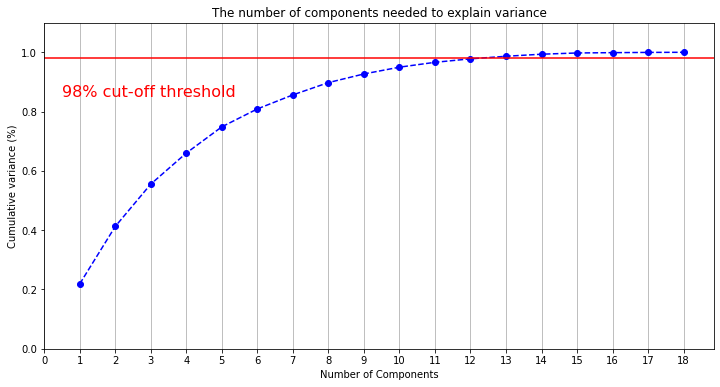

In [955]:
from sklearn.decomposition import PCA

pca = PCA().fit(new_X5)
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 19, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 19, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.98, color='r', linestyle='-')
plt.text(0.5, 0.85, '98% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

According the PCA plot (between # of components and cummulated explained variance), with 98% of explained variance cutoff, the suitable number of components in this case is 11, which means we have successfully reduce from 18 features to only 11 features

In [956]:
model = SVC()
num_folds = 10
seeds = 7
score = 'accuracy'
results = []
X7 = df4[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','in_out']].fillna(0).values.astype(np.float64)
mean7 = X7.mean(0)
sd7 =  X7.std(0)
new_X7 = (X7-mean7)/sd7
new_X7 = PCA(n_components=11).fit_transform(new_X7)
new_y7 = y_advance4
X_train7, X_test7, y_train7, y_test7 = train_test_split(new_X7, new_y7, test_size=0.2, random_state=123)
k_fold = KFold(n_splits=num_folds, shuffle=True, random_state=seeds)
cv = cross_val_score(model, X_train7, y_train7, cv=k_fold, scoring=score, error_score='raise')
results.append(cv)
a = (cv.mean(), cv.std())
print(a)

(0.47097487437185925, 0.04197112626573347)


In [957]:
model = SVC()
model.fit(X_train7, y_train7)
y_pred = model.predict(X_test7)

print('Accuracy on training dataset: ', accuracy_score(y_train7, model.predict(X_train7)))
print('Accuracy on test dataset: ', accuracy_score(y_test7, y_pred))
print('Classification report: \n', classification_report(y_test7, y_pred, zero_division=0)) #classification report

Accuracy on training dataset:  0.549049049049049
Accuracy on test dataset:  0.434
Classification report: 
               precision    recall  f1-score   support

      Euston       0.20      0.02      0.04        46
     british       0.38      0.11      0.17        94
      campus       0.44      0.84      0.57       140
  kensington       0.00      0.00      0.00        31
   southbank       0.28      0.10      0.14        51
     westend       0.46      0.61      0.52       138

    accuracy                           0.43       500
   macro avg       0.29      0.28      0.24       500
weighted avg       0.37      0.43      0.35       500



After PCA, the result on test dataset is virtually unchanged while the accuracy gap when predictinh on training set and on test set has been reduced, implying that the overfitting has been reduced a bit. **So, PCA may be a good choice for optimization and should be considered adding to final model**

### Hyperparameter Tunning with GridSearchCV

In [943]:
# Use GridSearchCV to tune model hyperparameters

# Set all possible values for each model parameters
params = {'C': [0.0001, 0.001, 0.01, 0.1, 0.5, 1, 3, 5],
          'gamma': ['scale', 'auto', 0.5, 1, 3, 5, 7]}

classifier =  SVC() # Initialize the classifier
clf_cv = GridSearchCV(classifier, params, cv = 10, scoring='accuracy', return_train_score=True) # Test all sets of hyperparameters with GridSearchCV, with 10-fold val
clf_cv.fit(X_train5, y_train5) # Fit the classifier with the best hyperparameter set on training data
result = pd.DataFrame(clf_cv.cv_results_)

print('Best hyperparameter setting: {0}.'.format(clf_cv.best_estimator_))
print('Average accuracy on validation set across folds of best hyperparameter setting: {0}.'.format(clf_cv.best_score_))
print('Average accuracy on train set across folds of best hyperparameter setting: ', np.mean(result[result['mean_test_score'] == float(clf_cv.best_score_)]['mean_train_score'].values))

Best hyperparameter setting: SVC(C=3).
Average accuracy on validation set across folds of best hyperparameter setting: 0.5154924623115578.
Average accuracy on train set across folds of best hyperparameter setting:  0.7063177169865102


In [945]:
y_pred = clf_cv.predict(X_test5)

print('Accuracy on test dataset: ', accuracy_score(y_test5, y_pred))
print('Classification report: \n', classification_report(y_test5, y_pred, zero_division=0)) #classification report

Accuracy on test dataset:  0.432
Classification report: 
               precision    recall  f1-score   support

      Euston       0.13      0.04      0.07        46
     british       0.33      0.22      0.27        94
      campus       0.46      0.75      0.57       140
  kensington       0.38      0.16      0.23        31
   southbank       0.17      0.08      0.11        51
     westend       0.51      0.57      0.54       138

    accuracy                           0.43       500
   macro avg       0.33      0.30      0.30       500
weighted avg       0.38      0.43      0.39       500



## Final Model for Advanced Component

In [967]:
X_advance_final = X_advance4 # predictors extracting from function getXy2
y_advance_final = y_advance4 # corresponding labels extracting from function getXy2

df_advance_final = pd.DataFrame(X_advance4, columns=['power','pitch_mean','pitch_std','pitch1_med','pitch1_95th','pitch1_5th','voiced_fr','chromagram_stft_mean','chromagram_stft_std','chromagram_q_mean','chromagram_q_std','chromagram_cen_mean','chromagram_cen_std','melspec_mean','melspec_std','mfcc_mean','mfcc_std','spectral_centroid_mean','spectral_centroid_std','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','spectral_rolloff_std','tonal_centroid_mean','tonal_centroid_std','zero_crossing_rate_mean','zero_crossing_rate_std','in_out'])
df_advance_final['in_out'] = df_advance_final['in_out'].apply(lambda x: (x=='indoor')*0 + (x=='outdoor')*1) # Hot encoding
df_advance_final = df_advance_final.astype('float') # Convert dtype

# Transform
Xadvance_final = df_advance_final[['power','pitch_mean','pitch_std','voiced_fr','pitch1_95th', 'pitch1_5th', 'chromagram_stft_mean', 'chromagram_q_mean', 'chromagram_q_std', 'mfcc_mean', 'mfcc_std', 'spectral_centroid_mean','spectral_bandwidth_mean','spectral_bandwidth_std','spectral_contrast_mean','spectral_contrast_std','spectral_rolloff_mean','in_out']].fillna(0).values.astype(np.float64)
mean_advance_final = Xadvance_final.mean(0)
sd_advance_final =  Xadvance_final.std(0)
new_X_advance_final = (Xadvance_final-mean_advance_final)/sd_advance_final
new_X_advance_final = PCA(n_components=11).fit_transform(new_X_advance_final) # Apply PCA to select meaningful features
new_y_advance_final = y_advance_final

# Split data into training and test set
X_ad_train, X_ad_test, y_ad_train, y_ad_test = train_test_split(new_X_advance_final, new_y_advance_final, test_size=0.2, random_state=123)

# Initialise and fit the model with best hyperparameter
clf_ad = SVC(C=3).fit(X_ad_train, y_ad_train)
y_ad_pred = clf_ad.predict(X_ad_test)

print('Accuracy on training dataset: ', accuracy_score(y_ad_train, clf_ad.predict(X_ad_train)))
print('Accuracy on test dataset: ', accuracy_score(y_ad_test, y_ad_pred))
print('Classification report: \n', classification_report(y_ad_test, y_ad_pred, zero_division=0)) #classification report
print('Confusion matrix: \n', confusion_matrix(y_ad_test, y_ad_pred))

Accuracy on training dataset:  0.6341341341341341
Accuracy on test dataset:  0.422
Classification report: 
               precision    recall  f1-score   support

      Euston       0.13      0.04      0.07        46
     british       0.43      0.17      0.24        94
      campus       0.43      0.76      0.55       140
  kensington       0.44      0.13      0.20        31
   southbank       0.23      0.12      0.16        51
     westend       0.46      0.56      0.50       138

    accuracy                           0.42       500
   macro avg       0.36      0.30      0.29       500
weighted avg       0.39      0.42      0.37       500

Confusion matrix: 
 [[  2   6  26   0   4   8]
 [  2  16  40   0   4  32]
 [  5   8 106   4   2  15]
 [  0   0  13   4   1  13]
 [  2   2  17   0   6  24]
 [  4   5  42   1   9  77]]


## 8. Results
   - The final average accuracy rate is overr 43% on test set and average ~51.5% on validation set. Though not being too good, this has been significantly improved, on validation set, from ~37.5% at the beginning to ~51.5% on the final model
   - Similarly, the f1-score among classes has been much better on final model, compared to that in initial one.
   
## 9. Conclusion
As can be seen from the above, it is quite clear that there are still challenges and rooms for improvement:
   - The model performance on predicting training data is not too high.
   - Though having applied different optimizing approaches, the issue of overfitting somehow still presents (though improve a lot).
   - There has been no suitable method found to best tackle imbalance dataset.